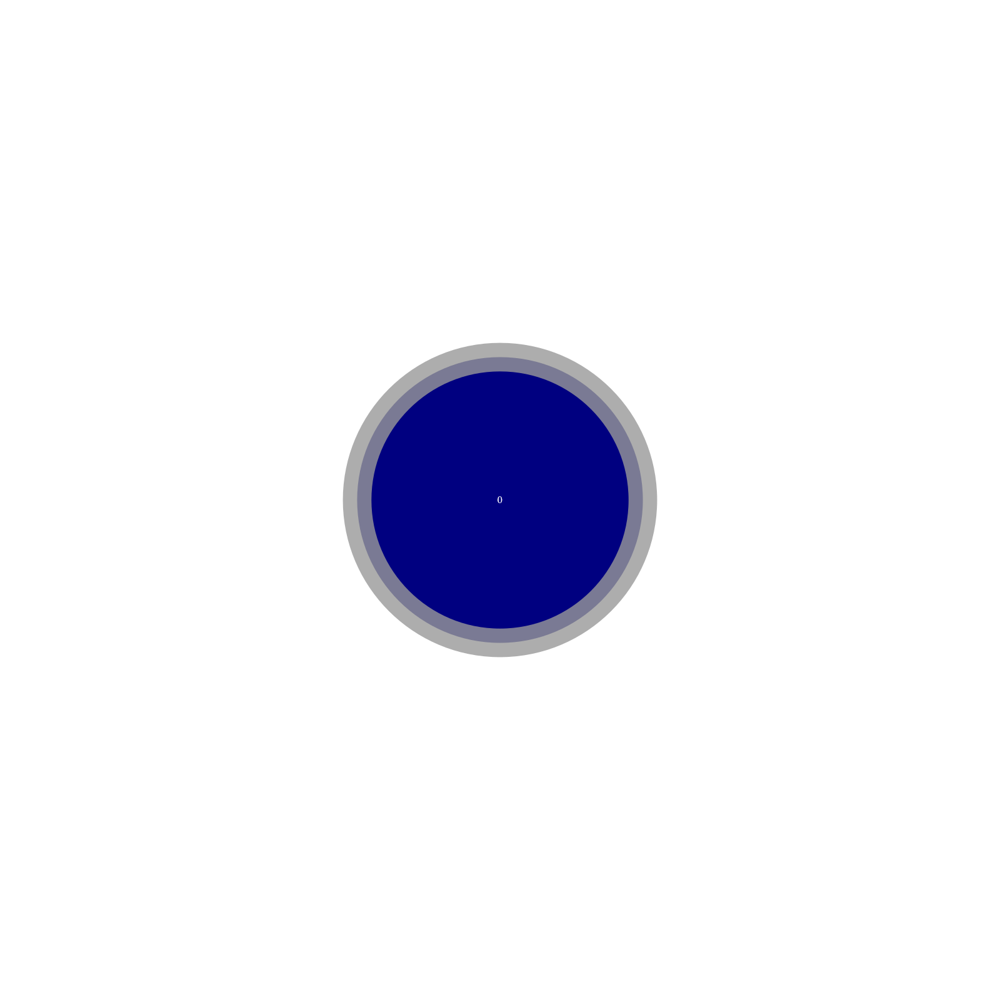

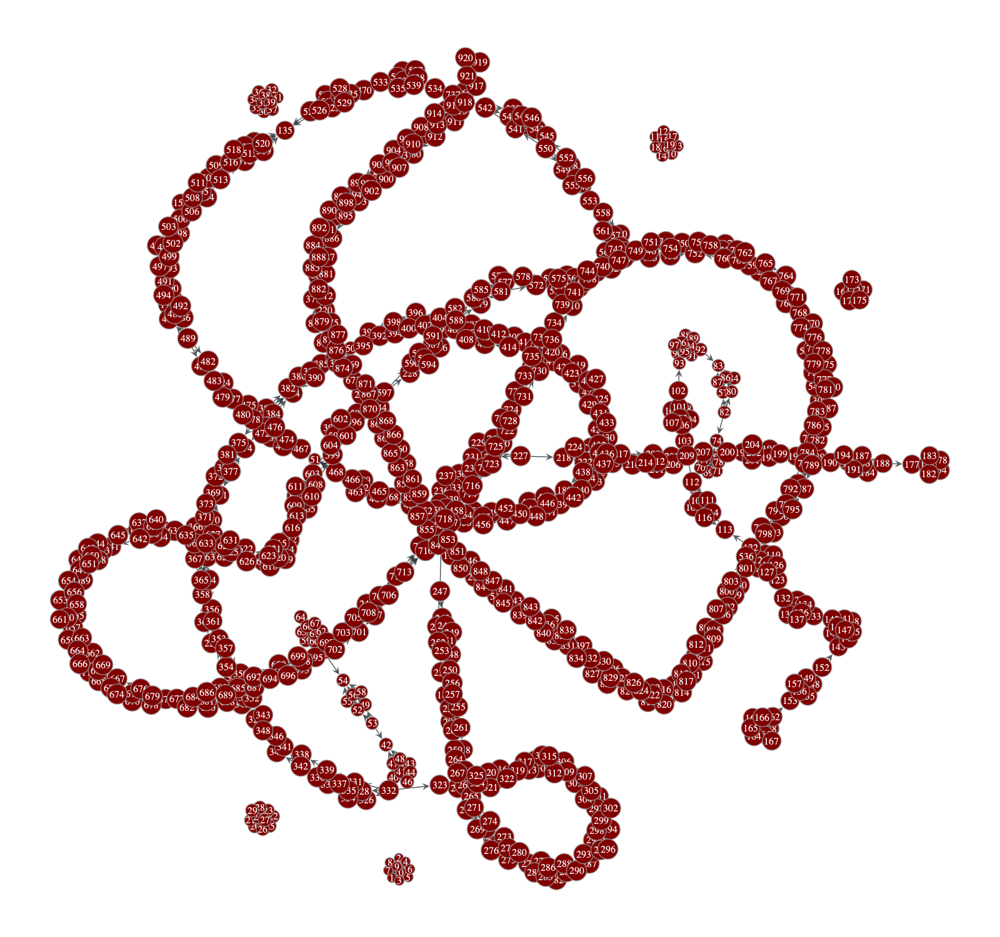

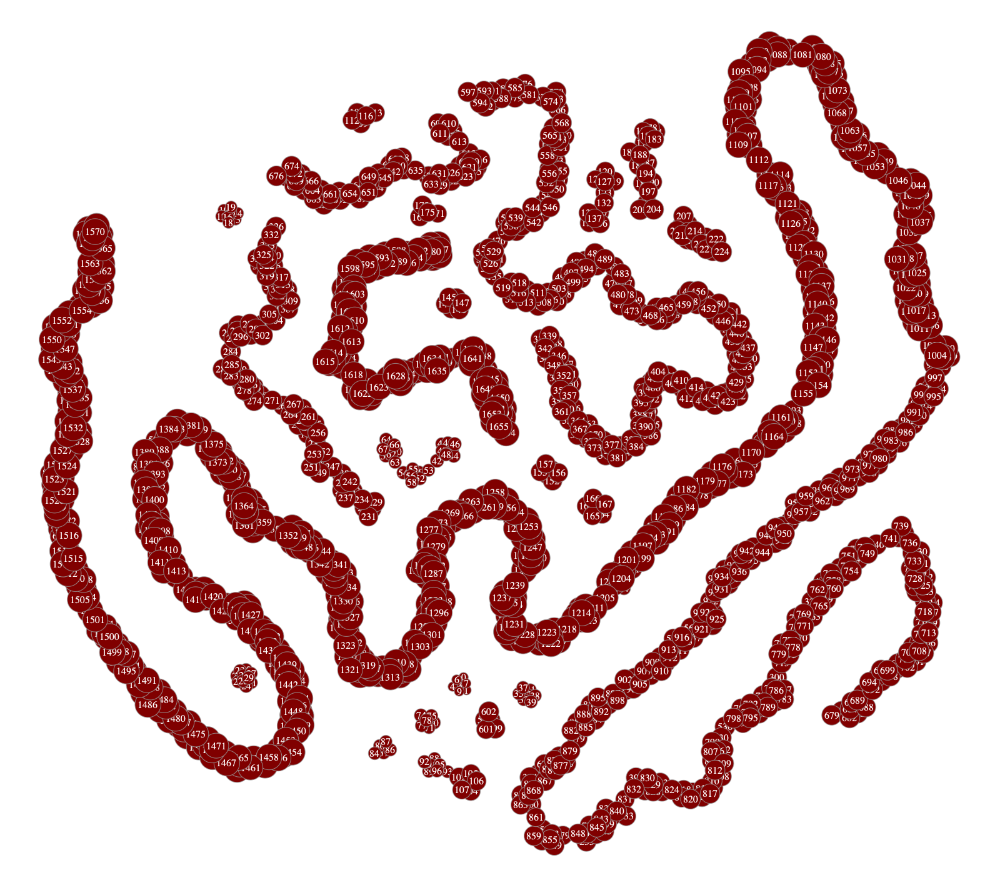

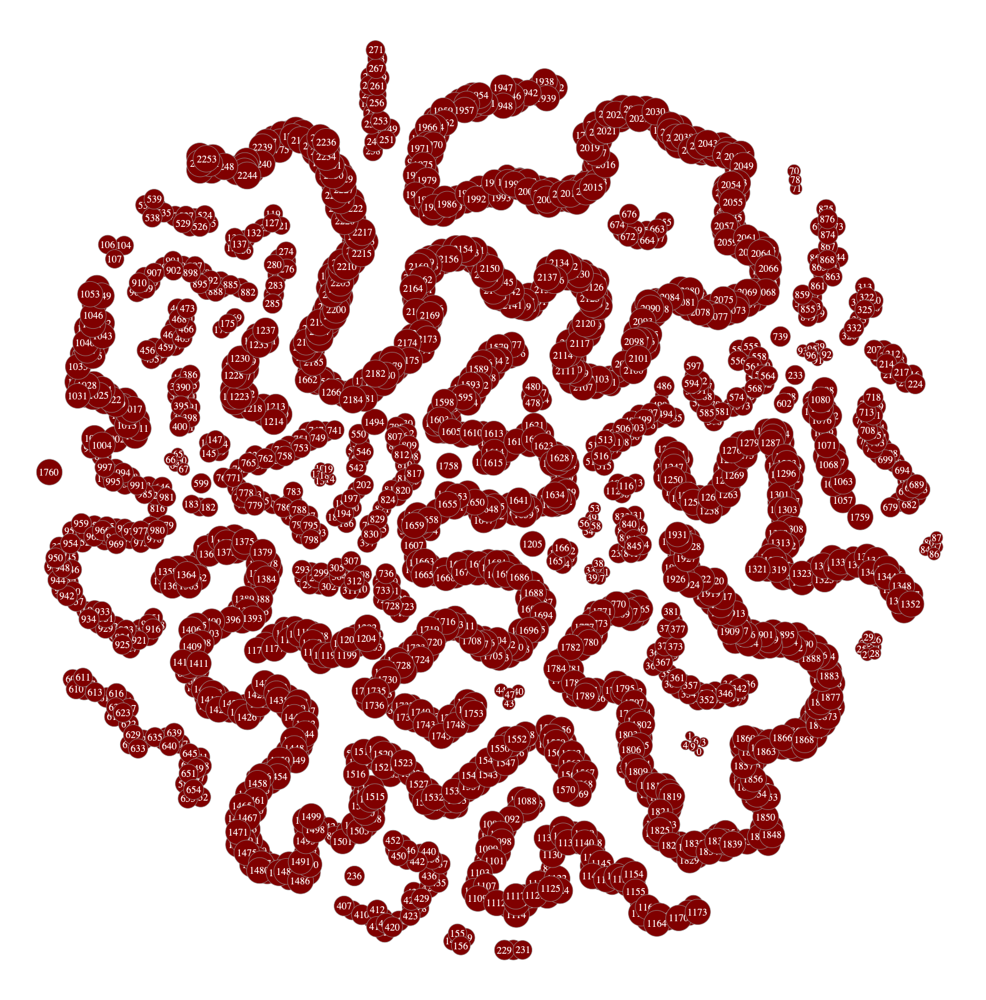

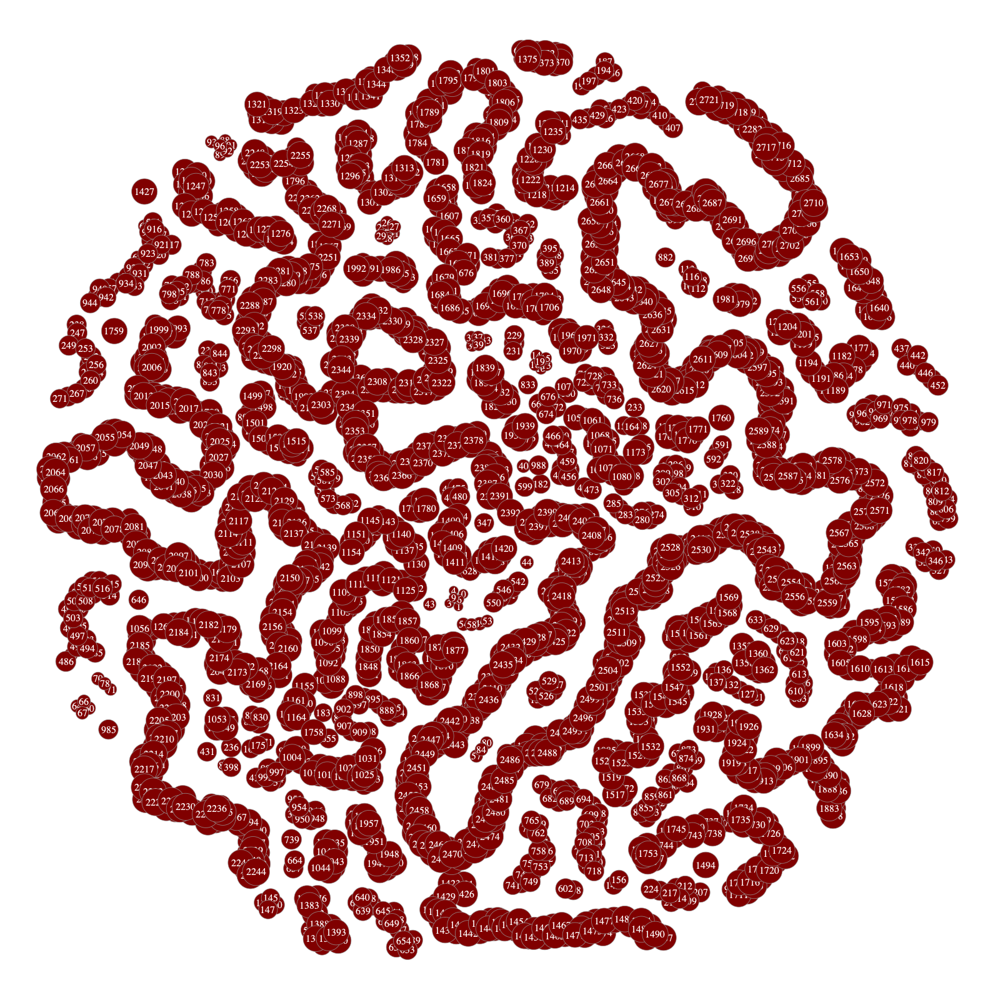

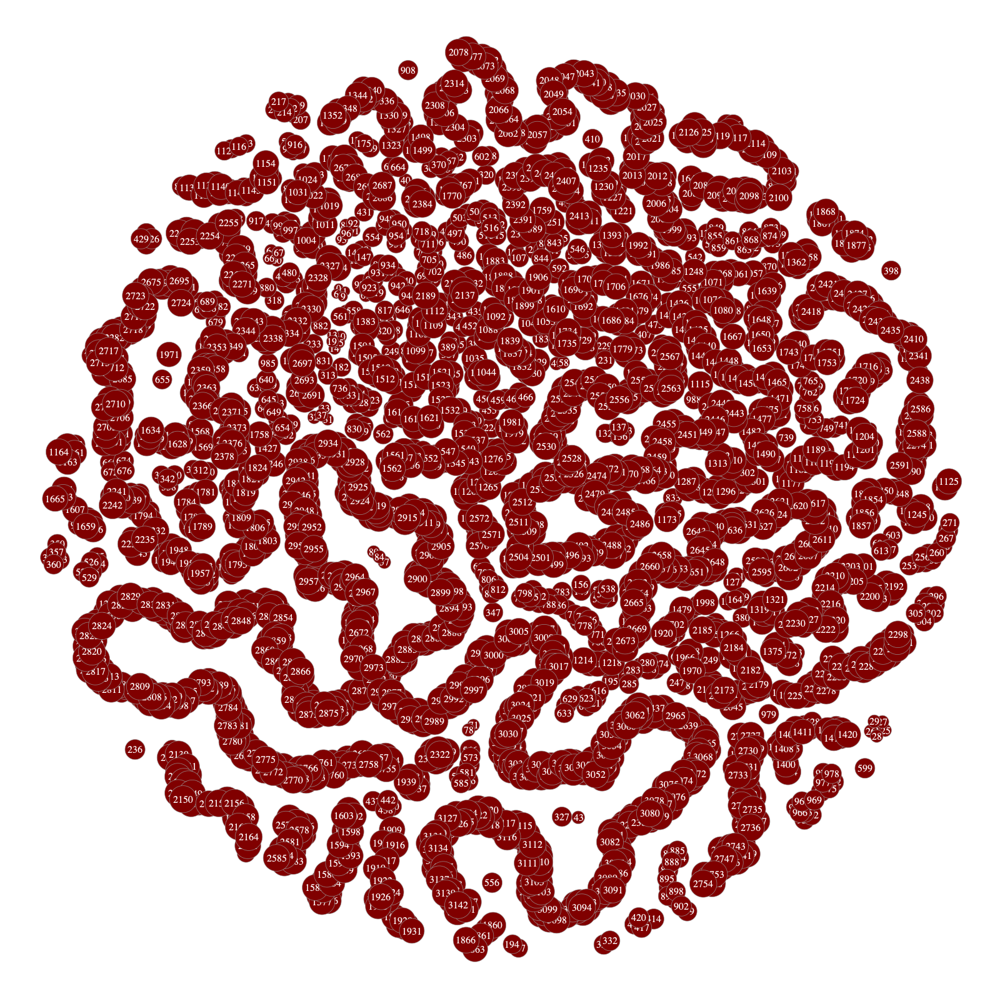

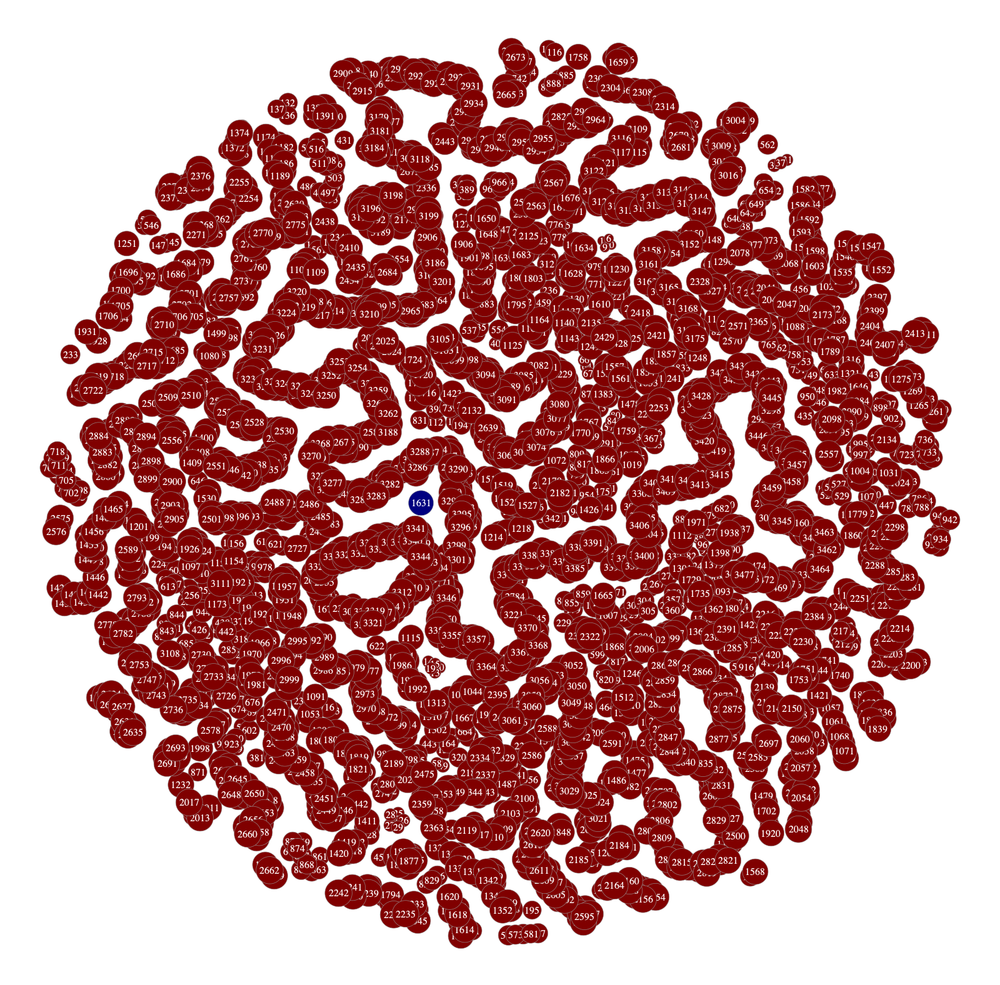

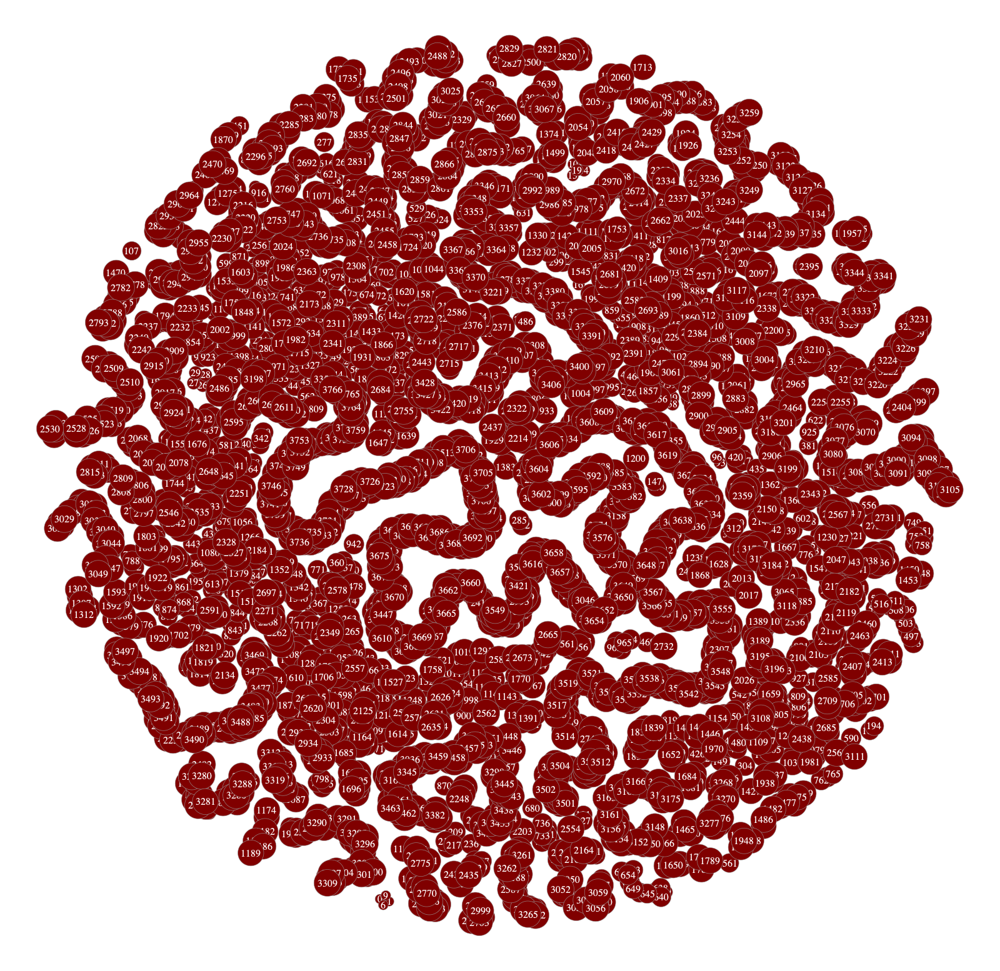

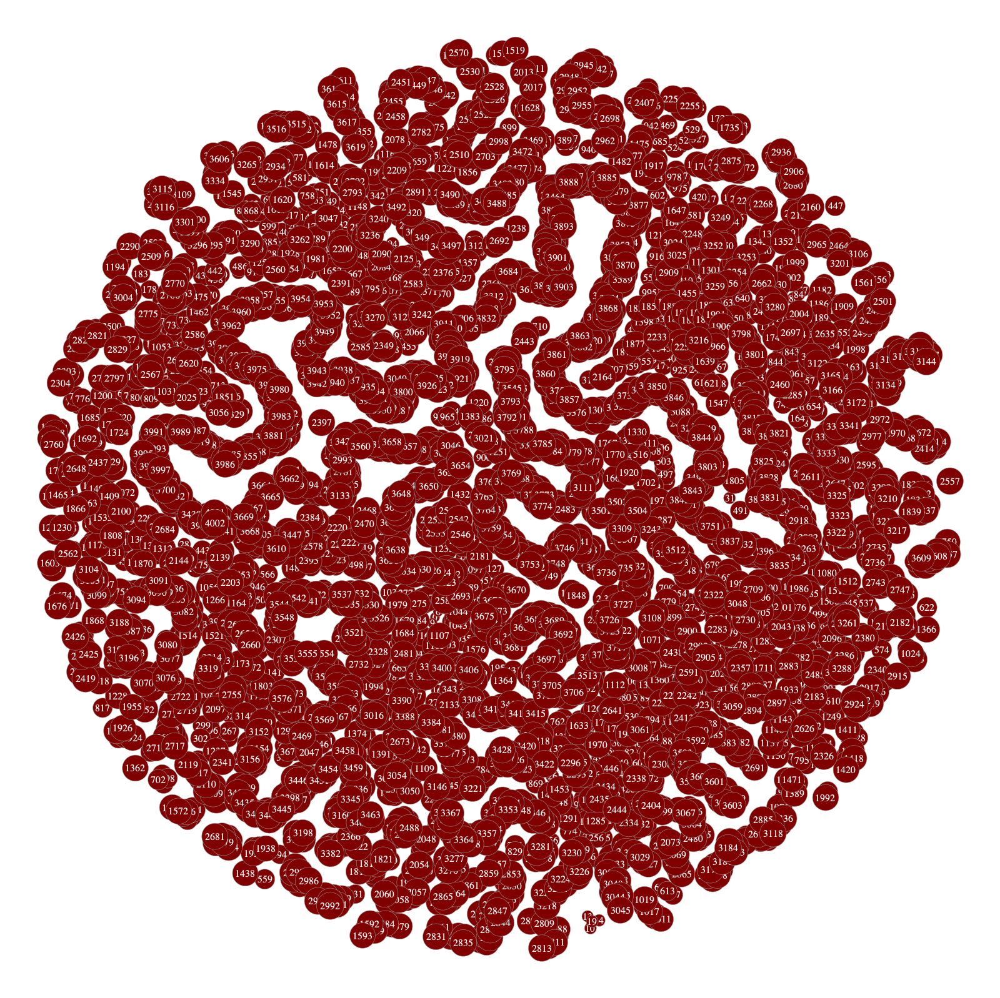

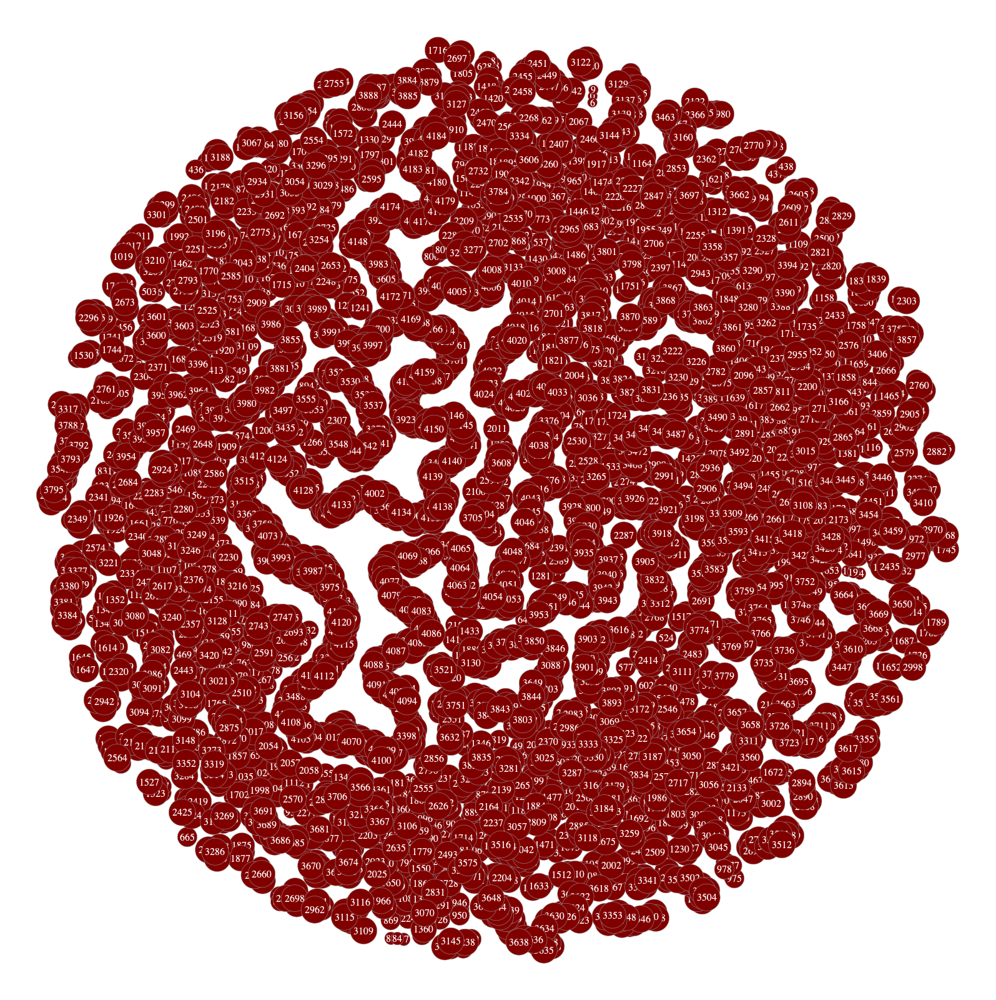

      Round   Isolated Nodes  Number of Nodes
0         0              [0]                1
1         1           [0, 1]                2
2         2        [0, 1, 2]                3
3         3     [0, 1, 2, 3]                4
4         4  [0, 1, 2, 3, 4]                5
...     ...              ...              ...
9995   9995               []                0
9996   9996               []                0
9997   9997               []                0
9998   9998               []                0
9999   9999            [374]                1

[10000 rows x 3 columns]
      Round  Number of Connected Nodes
0         0                          0
1         1                          0
2         2                          0
3         3                          0
4         4                          0
...     ...                        ...
9995   9995                       4358
9996   9996                       4358
9997   9997                       4358
9998   9998                     

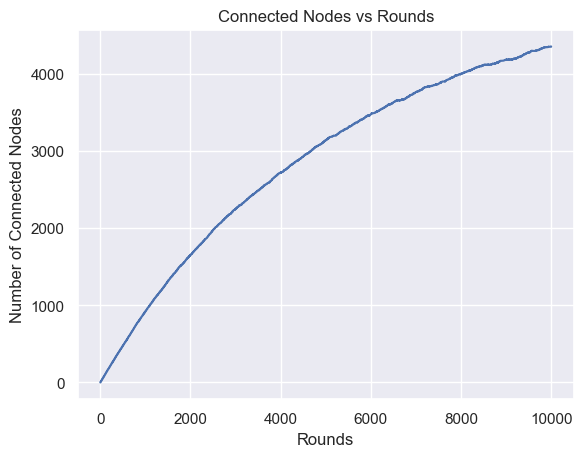

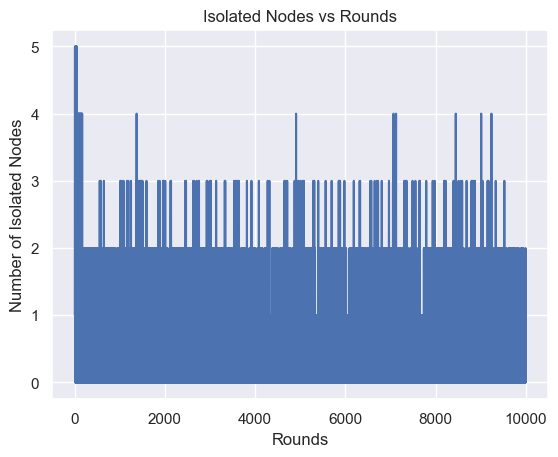

In [3]:
import random
import math
from graph_tool.all import *
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns


def add_node(graph, available_indices, cache_size):
    if available_indices:
        index = available_indices.pop()
        node = graph.vertex(index)
    else:
        node = graph.add_vertex()

    graph.vertex_properties["cache"][node] = set()
    graph.vertex_properties["cache_size"][node] = cache_size

    return node


def connect_nodes(graph, src, tgt):
    edge = graph.add_edge(src, tgt)
    graph.vertex_properties["degree"][src] += 1
    graph.vertex_properties["degree"][tgt] += 1


def disconnect_nodes(graph, src, tgt):
    edge = graph.edge(src, tgt)
    if edge:
        graph.remove_edge(edge)
        graph.vertex_properties["degree"][src] -= 1
        graph.vertex_properties["degree"][tgt] -= 1


def remove_node(graph, node):
    graph.clear_vertex(node)
    graph.vertex_properties["degree"][node] = 0
    graph.vertex_properties["cache"][node] = set()
    graph.vertex_properties["cache_size"][node] = -1


def update_cache(graph, node, neighbor_ids, cache_size):
    node_cache = graph.vertex_properties["cache"][node]
    node_cache.update(neighbor_ids)
    while len(node_cache) > cache_size and node_cache:
        node_cache.pop()


def main():
    n = 5000     #Number of nodes
    rounds = 10000
    lambda_ = 1
    mu = 1 / n
    cache_size = int(math.log2(n))
    d1 = 3
    d2 = 5
    interval = 1000

    graph = Graph()
    available_indices = set()

    degree = graph.new_vertex_property("int")
    cache = graph.new_vertex_property("object")
    cache_size_property = graph.new_vertex_property("int")

    graph.vertex_properties["degree"] = degree
    graph.vertex_properties["cache"] = cache
    graph.vertex_properties["cache_size"] = cache_size_property

    # Add the new vertex property map for colors
    color = graph.new_vertex_property("vector<double>")

    # Add the color property to the graph's vertex properties
    graph.vertex_properties["color"] = color

    isolated_nodes = []
    connected_nodes = []

    for t in range(rounds):
        # Add new node
        new_node = add_node(graph, available_indices, cache_size)

        # Disconnect nodes with probability mu
        for v in graph.vertices():
            if random.random() < mu:
                available_indices.add(int(v))
                remove_node(graph, v)

        # Connect new node to server cache
        server_cache = {v for v in graph.vertices(
        ) if graph.vertex_properties["degree"][v] < d2}
        neighbors_to_connect = min(len(server_cache), d2)
        if len(server_cache - {new_node}) >= neighbors_to_connect:  # Add this line
            # When creating connections between nodes, the code ensures
            #  that the new node doesn't connect to itself
            random_neighbors = random.sample(
                list(server_cache - {new_node}), neighbors_to_connect)
            for neighbor in random_neighbors:
                connect_nodes(graph, new_node, neighbor)

        # Update connections and cache
        for node in graph.vertices():
            degree = graph.vertex_properties["degree"][node]

            if degree > 0:
                # Request neighbors
                neighbor_ids = {v for e in node.out_edges()
                                for v in (e.source(), e.target()) if v != node}
                update_cache(graph, node, neighbor_ids,
                             graph.vertex_properties["cache_size"][node])

                if degree <= d2:
                    # Connect to nodes from the local cache and makes sure 
                    # it doesn't connect to itself
                    nodes_to_connect = graph.vertex_properties["cache"][node] - set(
                        node.out_neighbours())
                    for _ in range(min(d2 - degree, len(nodes_to_connect))):
                        neighbor = nodes_to_connect.pop()
                        connect_nodes(graph, node, neighbor)

        connected_nodes_at_t = [v for v in graph.vertices(
        ) if graph.vertex_properties["degree"][v] > 0]
        connected_nodes.append((t, len(connected_nodes_at_t)))

        if t % interval == 0:  # Visualize the graph and collect isolated nodes every 20 rounds
            # Update the colors of the nodes based on whether they are isolated or connected
            for v in graph.vertices():
                if graph.vertex_properties["degree"][v] == 0:
                    graph.vertex_properties["color"][v] = [0, 0, 0.5, 1]  # Blue color for isolated nodes
                else:
                    graph.vertex_properties["color"][v] = [0.5, 0, 0, 1]  # Red color for connected nodes

            pos = sfdp_layout(graph)
            graph_draw(graph, pos, vertex_text=graph.vertex_index,
                       vertex_font_size=8, vertex_fill_color=graph.vertex_properties["color"], output_size=(800, 800))

        isolated_nodes_at_t = [v for v in graph.vertices(
            ) if graph.vertex_properties["degree"][v] == 0]
        isolated_nodes.append((t, isolated_nodes_at_t))

    isolated_nodes_df = pd.DataFrame(isolated_nodes, columns=[
                                     'Round', 'Isolated Nodes'])
    isolated_nodes_df['Number of Nodes'] = isolated_nodes_df['Isolated Nodes'].apply(len)
    # isolated_nodes_df.to_csv('isolated_nodes.csv', index=False) #Saving the file as .csv
    print(isolated_nodes_df)

    connected_nodes_df = pd.DataFrame(connected_nodes, columns=[
        'Round', 'Number of Connected Nodes'])

    print(connected_nodes_df)

    # Plotting using sns
    sns.set(style="darkgrid")
    sns.lineplot(x="Round", y="Number of Connected Nodes",
                 data=connected_nodes_df)
    plt.xlabel('Rounds')
    plt.ylabel('Number of Connected Nodes')
    plt.title('Connected Nodes vs Rounds')
    plt.show()

    #Plotting using sns 
    sns.set(style="darkgrid")
    sns.lineplot(x="Round", y="Number of Nodes", data=isolated_nodes_df)
    plt.xlabel('Rounds')
    plt.ylabel('Number of Isolated Nodes')
    plt.title('Isolated Nodes vs Rounds')
    plt.show()


if __name__ == "__main__":
    main()
